# About this demo

Colorization algorithms have a wide range of applications in various fields, such as historical photo restoration and artistic rendering. 

This demo shows the how to integrate the state of art AI algorithms into the BMF video processing pipeline. The famous open source colorization algorithm [DeOldify](https://github.com/jantic/DeOldify) is wrapped as an BMF pyhton module in less than 100 lines of codes. 


# Acknowledgement
The algorithm used in the demo is forked from the github project [DeOldify](https://github.com/jantic/DeOldify). We want to express our sincere appreciation and gratitude to the authors for this exceptional open-source project.

# Get Started

## 1. Environment Setup

*   install the environment for the deoldify algorithm
*   install the BMF


### 1-1 git clone the deoldify project. 
The project is forked from the original github project. We add some suppport for Pillow Image input.

In [1]:
!git clone https://github.com/eefengwei/DeOldify.git DeOldify

fatal: destination path 'DeOldify' already exists and is not an empty directory.


### 1-2 install the dependent python packages

In [2]:
!pip3 install -r ./DeOldify/requirements-colab.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


### 1-3 download the pretrained-weights

In [3]:
!mkdir -p ./DeOldify/models
!wget -c https://data.deepai.org/deoldify/ColorizeVideo_gen.pth -O ./DeOldify/models/ColorizeVideo_gen.pth

--2023-06-05 06:40:28--  https://data.deepai.org/deoldify/ColorizeVideo_gen.pth
Resolving data.deepai.org (data.deepai.org)... 169.150.236.99, 2400:52e0:1a00::718:1
Connecting to data.deepai.org (data.deepai.org)|169.150.236.99|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.



### 1-4 pip install BMF packages

In [4]:
!gdown --fuzzy https://drive.google.com/file/d/1B2iUlDEUuled09IFYE3C2mD1Rx1LEmd6/view?usp=sharing -O bmf-3.0.0-cp310-none-linux_x86_64.whl
!pip3 install bmf-3.0.0-cp310-none-linux_x86_64.whl

Downloading...
From: https://drive.google.com/uc?id=1B2iUlDEUuled09IFYE3C2mD1Rx1LEmd6
To: /content/bmf-3.0.0-cp310-none-linux_x86_64.whl
100% 98.3M/98.3M [00:00<00:00, 122MB/s]
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing ./bmf-3.0.0-cp310-none-linux_x86_64.whl
bmf is already installed with the same version as the provided wheel. Use --force-reinstall to force an installation of the wheel.


### 1-5 verify the FFmpeg libraries is installed and version is correct

BMF framework utilizes the FFmpeg video decoders and encoders as the built-in modules for video decoding and encoding. **It's neccessary for users to install supported FFmpeg libraries before using BMF.** 

**Optional step**

Install ffmpeg and related libraries. For this demo, we don't have to do this step, because ffmpeg libraries are already installed in the Google Colab environment.

In [5]:
!sudo apt install ffmpeg

Reading package lists... Done
Building dependency tree       
Reading state information... Done
ffmpeg is already the newest version (7:4.2.7-0ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 34 not upgraded.


List the ffmpeg libraries. It is expected that the related libraries such libavcodec, libavformat are installed. The output should be showned as below:
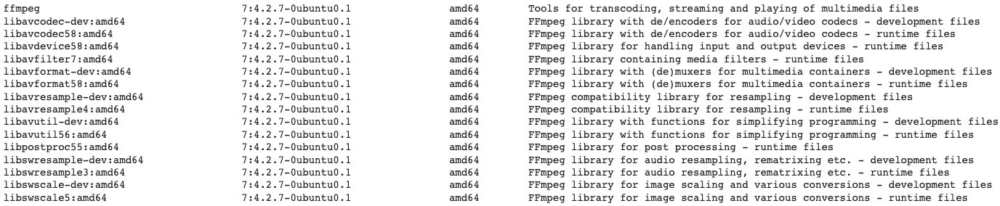

In [6]:
!dpkg -l | grep -i ffmpeg

ii  ffmpeg                                 7:4.2.7-0ubuntu0.1                amd64        Tools for transcoding, streaming and playing of multimedia files
ii  libavcodec-dev:amd64                   7:4.2.7-0ubuntu0.1                amd64        FFmpeg library with de/encoders for audio/video codecs - development files
ii  libavcodec58:amd64                     7:4.2.7-0ubuntu0.1                amd64        FFmpeg library with de/encoders for audio/video codecs - runtime files
ii  libavdevice58:amd64                    7:4.2.7-0ubuntu0.1                amd64        FFmpeg library for handling input and output devices - runtime files
ii  libavfilter7:amd64                     7:4.2.7-0ubuntu0.1                amd64        FFmpeg library containing media filters - runtime files
ii  libavformat-dev:amd64                  7:4.2.7-0ubuntu0.1                amd64        FFmpeg library with (de)muxers for multimedia containers - development files
ii  libavformat58:amd64                    7:4.

Display the FFmpeg version. **BMF supports the FFmpeg verions above 4.2.x.**

In [7]:
!ffmpeg -version

ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enabl

### 1-6 install wurlitzer

This package is installed to show the BMF C++ logs in the colab console, otherwise only python logs are printed. This step is not necessary if you're not in a Colab or iPython notebook environment.

In [8]:
!pip install wurlitzer
%load_ext wurlitzer

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## 2. BMF processing pipeline programming
*   implement the customized BMF python module, which is the DeOldify video colorization algorithm.
*   set up the BMF processing pipeline (decoding->colorizaiton->encoding) and run it. 
*  display the results.

Add the DeOldify folder to the python search path

In [9]:
import sys
sys.path.insert(0, '/content/DeOldify')
print(sys.path)

['/content/DeOldify', '/content', '/env/python', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '', '/usr/local/lib/python3.10/dist-packages', '/usr/lib/python3/dist-packages', '/usr/local/lib/python3.10/dist-packages/IPython/extensions', '/root/.ipython']


### 2-1 Customized BMF module

Implement the customized BMF python module, which is the DeOldify video colorization algorithm.

In [10]:
%%file py_deoldify_module.py

import bmf
import numpy as np
from bmf import ProcessResult, Packet, Timestamp, VideoFrame
import PIL
import bmf.hml.hmp as mp

from deoldify import device
from deoldify.device_id import DeviceId
import torch
from deoldify.visualize import *
import warnings

debug = False

class py_deoldify_module(bmf.Module):
    def __init__(self, node, option=None):
        print(f'py_deoldify_module init ...')
        self.node_ = node
        self.option_ = option
        print(option)
        warnings.filterwarnings("ignore", category=UserWarning, message=".*?Your .*? set is empty.*?")
        
        #NOTE:  This must be the first call in order to work properly!
        #choices:  CPU, GPU0...GPU7
        device.set(device=DeviceId.GPU0)

        if not torch.cuda.is_available():
            print('warning: GPU is not available, the computation is going to be very slow...')

        weight_path=Path('/content/DeOldify')
        if option and 'model_path' in option.keys():
            model_path = option['model_path']
            if not model_path:
                print(f'model_path={model_path}')
                weight_path=Path(model_path)

        self.colorizer = get_stable_video_colorizer(weight_path)
        self.idx = 0

        print(f'py_deoldify_module init successfully...')


    def process(self, task):
        # iterate through all input queues to the module
        idx = self.idx

        for (input_id, input_queue) in task.get_inputs().items():
            # get output queue
            output_queue = task.get_outputs()[input_id]

            while not input_queue.empty():
                # get the earliest packet from queue
                packet = input_queue.get()
                
                # handle EOF
                if packet.timestamp == Timestamp.EOF:
                    output_queue.put(Packet.generate_eof_packet())
                    task.timestamp = Timestamp.DONE

                # process packet if not empty
                if packet.timestamp != Timestamp.UNSET and packet.is_(VideoFrame):

                    vf = packet.get(VideoFrame)
                    rgb = mp.PixelInfo(mp.kPF_RGB24)
                    np_vf = vf.reformat(rgb).frame().plane(0).numpy()

                    # numpy to PIL
                    image = Image.fromarray(np_vf.astype('uint8'), 'RGB')

                    colored_image = self.colorizer.colorize_single_frame_from_image(image)

                    if not colored_image:
                        print(f'Fail to process the input image with idx = {idx}')
                        continue

                    if debug:
                        input_name = f'video/bmf_raw/frame_{idx}.png'
                        print(f'input_name = {input_name}')
                        image.save(input_name)

                        output_name = f'video/bmf_out/frame_{idx}.png'
                        print(f'output_name = {output_name}')
                        colored_image.save(output_name)

                    self.idx = idx + 1
                    out_frame_np = np.array(colored_image)
                    rgb = mp.PixelInfo(mp.kPF_RGB24)
                    frame = mp.Frame(mp.from_numpy(out_frame_np), rgb)

                    out_frame = VideoFrame(frame)
                    out_frame.pts = vf.pts
                    out_frame.time_base = vf.time_base

                    pkt = Packet(out_frame)
                    pkt.timestamp = out_frame.pts

                    output_queue.put(pkt)


        return ProcessResult.OK


Overwriting py_deoldify_module.py


### Note: Use Colab GPU steps

If you want to use the free GPU provided by Google Colab, please follow such steps:

*   Click on the "Change" tab in the menu bar.
*   Select "Notebook settings" from the dropdown menu.
*   In the "Hardware accelerator" section, make sure "GPU" is selected.
*   Click on the "Save" button.

After saving the changes, your Colab notebook will be configured to run on a GPU. You can verify this by running the following code snippet in a code cell:

In [18]:
import torch

if torch.cuda.is_available():
    print('GPU is available!')
else:
    print('GPU is not available!')

GPU is available!


In [19]:
!nvcc -V

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0


### 2-2 BMF pipeline setup and execution

input_video_path is the input video path, and output_video_path is the output colored video path. model_weight_path is the path where you download the model weights in step 1-3.

In [14]:
import bmf
import py_deoldify_module

input_video_path = '/content/drive/MyDrive/deoldify/oldvideo.mp4'
output_video_path = '/content/colored_video.mp4'
model_weight_path = '/content/DeOldify/'

graph = bmf.graph()

video = graph.decode({"input_path": input_video_path})

output_video = video['video'].module('py_deoldify_module', option={"model_path": "/content/DeOldify/"})

bmf.encode(
    output_video[0],
    None,
    {"output_path": output_video_path}
    ).run()

INFO:numexpr.utils:NumExpr defaulting to 2 threads.


NumExpr defaulting to 2 threads.
{
    "input_streams": [],
    "output_streams": [],
    "nodes": [
        {
            "module_info": {
                "name": "c_ffmpeg_decoder",
                "type": "",
                "path": "",
                "entry": ""
            },
            "meta_info": {
                "premodule_id": -1,
                "callback_binding": []
            },
            "option": {
                "input_path": "/content/drive/MyDrive/deoldify/oldvideo.mp4"
            },
            "input_streams": [],
            "output_streams": [
                {
                    "identifier": "video:c_ffmpeg_decoder_0_1",
                    "stream_alias": ""
                }
            ],
            "input_manager": "immediate",
            "scheduler": 0,
            "alias": "",
            "id": 0
        },
        {
            "module_info": {
                "name": "py_deoldify_module",
                "type": "",
                "path": ""

Input #0, mov,mp4,m4a,3gp,3g2,mj2, from '/content/drive/MyDrive/deoldify/oldvideo.mp4':
  Metadata:
    major_brand     : isom
    minor_version   : 512
    compatible_brands: isomiso2avc1mp41
    encoder         : Lavf58.29.100
  Duration: 00:00:09.20, start: 0.000000, bitrate: 4215 kb/s
    Stream #0:0(und): Video: h264 (High) (avc1 / 0x31637661), yuv420p(tv, bt709), 1920x1080 [SAR 1:1 DAR 16:9], 4126 kb/s, 10 fps, 10 tbr, 10240 tbn, 20 tbc (default)
    Metadata:
      handler_name    : ISO Media file produced by Google Inc.
    Stream #0:1(und): Audio: aac (LC) (mp4a / 0x6134706D), 44100 Hz, stereo, fltp, 127 kb/s (default)
    Metadata:
      handler_name    : ISO Media file produced by Google Inc.


[2023-06-05 06:40:44.963] [info] c++ module constructed
[2023-06-05 06:40:44.963] [info] debug module_name: py_deoldify_module type:  path:  entry: 
[2023-06-05 06:40:44.963] [info] Module info py_deoldify_module python py_deoldify_module.py_deoldify_module /content
py_deoldify_module init ...
{'model_path': '/content/DeOldify/'}


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can al

py_deoldify_module init successfully...
[2023-06-05 06:41:04.119] [info] debug module_name: c_ffmpeg_encoder type:  path:  entry: 
[2023-06-05 06:41:04.119] [info] c_ffmpeg_encoder c++ /usr/local/lib/python3.10/dist-packages/bmf/lib/libbuiltin_modules.so libbuiltin_modules.CFFEncoder
[2023-06-05 06:41:04.119] [info] Module info c_ffmpeg_encoder c++ libbuiltin_modules.CFFEncoder /usr/local/lib/python3.10/dist-packages/bmf/lib/libbuiltin_modules.so
[2023-06-05 06:41:04.120] [info] Constructing c++ module
[2023-06-05 06:41:04.120] [info] c++ module constructed
[2023-06-05 06:41:04.121] [info] BMF Version: 3.0.0
[2023-06-05 06:41:04.121] [info] BMF Commit: 
[2023-06-05 06:41:04.121] [info] start init graph
[2023-06-05 06:41:04.121] [info] scheduler count2
[2023-06-05 06:41:04.121] [info] node:c_ffmpeg_decoder 0 scheduler 0
[2023-06-05 06:41:04.127] [info] node:py_deoldify_module 1 scheduler 0
[2023-06-05 06:41:04.127] [info] node:c_ffmpeg_encoder 2 scheduler 1


[libx264 @ 0x7f36a0002ec0] ignoring invalid SAR: 0/0
[libx264 @ 0x7f36a0002ec0] using cpu capabilities: MMX2 SSE2Fast SSSE3 SSE4.2 AVX FMA3 BMI2 AVX2
[libx264 @ 0x7f36a0002ec0] profile High, level 4.0
[libx264 @ 0x7f36a0002ec0] 264 - core 155 r2917 0a84d98 - H.264/MPEG-4 AVC codec - Copyleft 2003-2018 - http://www.videolan.org/x264.html - options: cabac=1 ref=3 deblock=1:0:0 analyse=0x3:0x113 me=hex subme=7 psy=1 psy_rd=1.00:0.00 mixed_ref=1 me_range=16 chroma_me=1 trellis=1 8x8dct=1 cqm=0 deadzone=21,11 fast_pskip=1 chroma_qp_offset=-2 threads=3 lookahead_threads=1 sliced_threads=0 nr=0 decimate=1 interlaced=0 bluray_compat=0 constrained_intra=0 bframes=3 b_pyramid=2 b_adapt=1 b_bias=0 direct=1 weightb=1 open_gop=0 weightp=2 keyint=250 keyint_min=25 scenecut=40 intra_refresh=0 rc_lookahead=40 rc=crf mbtree=1 crf=23.0 qcomp=0.60 qpmin=0 qpmax=69 qpstep=4 ip_ratio=1.40 aq=1:1.00
Output #0, mp4, to '/content/colored_video.mp4':
  Metadata:
    encoder         : Lavf58.29.100
    Stream #

[2023-06-05 06:41:07.320] [info] *** 1 dup!
[2023-06-05 06:41:08.009] [info] *** 1 dup!
[2023-06-05 06:41:08.702] [info] *** 2 dup!
[2023-06-05 06:41:09.726] [info] *** 1 dup!
[2023-06-05 06:41:10.855] [info] *** 2 dup!
[2023-06-05 06:41:11.932] [info] *** 1 dup!
[2023-06-05 06:41:12.975] [info] *** 2 dup!
[2023-06-05 06:41:13.815] [info] *** 1 dup!
[2023-06-05 06:41:14.489] [info] *** 2 dup!
[2023-06-05 06:41:15.181] [info] *** 1 dup!
[2023-06-05 06:41:15.857] [info] *** 2 dup!
[2023-06-05 06:41:16.580] [info] *** 1 dup!
[2023-06-05 06:41:17.265] [info] *** 2 dup!
[2023-06-05 06:41:17.955] [info] *** 1 dup!
[2023-06-05 06:41:18.658] [info] *** 2 dup!
[2023-06-05 06:41:19.338] [info] *** 1 dup!
[2023-06-05 06:41:20.181] [info] *** 2 dup!
[2023-06-05 06:41:21.247] [info] *** 1 dup!
[2023-06-05 06:41:21.947] [info] *** 2 dup!
[2023-06-05 06:41:22.923] [info] *** 1 dup!
[2023-06-05 06:41:23.767] [info] *** 2 dup!
[2023-06-05 06:41:27.298] [info] *** 1 dup!
[2023-06-05 06:41:27.366] [info]

[libx264 @ 0x7f36a0002ec0] frame I:3     Avg QP:20.21  size: 73643
[libx264 @ 0x7f36a0002ec0] frame P:58    Avg QP:23.51  size: 43932
[libx264 @ 0x7f36a0002ec0] frame B:165   Avg QP:23.74  size:  6886
[libx264 @ 0x7f36a0002ec0] consecutive B-frames:  1.3%  2.7%  4.0% 92.0%
[libx264 @ 0x7f36a0002ec0] mb I  I16..4: 15.1% 78.0%  6.9%
[libx264 @ 0x7f36a0002ec0] mb P  I16..4: 15.3% 35.8%  0.9%  P16..4: 35.3%  8.8%  1.5%  0.0%  0.0%    skip: 2.3%
[libx264 @ 0x7f36a0002ec0] mb B  I16..4:  1.4%  2.3%  0.0%  B16..8: 11.1%  1.7%  0.1%  direct: 3.6%  skip:79.7%  L0:46.5% L1:48.6% BI: 4.9%
[libx264 @ 0x7f36a0002ec0] 8x8 transform intra:68.6% inter:88.5%
[libx264 @ 0x7f36a0002ec0] coded y,uvDC,uvAC intra: 41.6% 73.0% 28.4% inter: 10.0% 21.5% 1.0%
[libx264 @ 0x7f36a0002ec0] i16 v,h,dc,p: 15% 54%  6% 25%
[libx264 @ 0x7f36a0002ec0] i8 v,h,dc,ddl,ddr,vr,hd,vl,hu: 23% 33% 15%  3%  5%  5%  8%  4%  4%
[libx264 @ 0x7f36a0002ec0] i4 v,h,dc,ddl,ddr,vr,hd,vl,hu: 24% 38%  9%  3%  8%  6%  8%  3%  2%
[libx264 @ 

[2023-06-05 06:42:40.286] [info] node id:2 close node
[2023-06-05 06:42:40.287] [info] node 2 close report, closed count: 3
[2023-06-05 06:42:40.287] [info] schedule queue 0 start to join thread
[2023-06-05 06:42:40.287] [info] schedule queue 0 thread quit
[2023-06-05 06:42:40.287] [info] schedule queue 0 closed
[2023-06-05 06:42:40.287] [info] schedule queue 1 start to join thread
[2023-06-05 06:42:40.287] [info] schedule queue 1 thread quit
[2023-06-05 06:42:40.287] [info] schedule queue 1 closed
[2023-06-05 06:42:40.287] [info] all scheduling threads were joint


### 2-3 Display the processed video

In [15]:
from IPython.display import HTML
from base64 import b64encode

def show_video(video_path, video_width = 800):
   
  video_file = open(video_path, "r+b").read()
 
  video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"

  return HTML(f"""<video width={video_width} controls><source src="{video_url}"></video>""")

In [16]:
# show input video
show_video(input_video_path)

In [17]:
# show output video
show_video(output_video_path)